# Week 4 - Counting Words & Phrases

This week, we take text corpora that we have developed, spidered, scraped, and encoded, and we find and count words, simple and parsed phrases and explore the statistical properties of those counts (e.g., word frequency distributions). Initially, we model how to search corpora for keywords or phrases. Next, we examine the distributions of terms and phrases across a corpus, and the correlation between different words and phrase counts. In order to do this effectively, we coarsely disambiguate words based of part-of-speech (POS) tagging, and normalize them through stemming and lemmatization. Next we distinguish *important* words and phrase within the corpus, and image them with Wordls! Then we calculate word frequenceis, conditional frequences (the frequency of word *shock* conditional on the presence of word *awe*), and statistically significant collocations of lengths 2 through $n$. Finally, we calculate and visualize Differences (Divergences and Distances) between the word frequency distributions from two corpora. 

Then we shift to focus not simply on the *ideas* in a corpus, but also extracting precise *claims*. This process involves a sequential pipeline of classifying and structuring tokens from text, each of which generates potentially useful data for the content analyst. Steps in this process, which we examine in this notebook, include: 1) tagging words by their part of speech (POS) to reveal the linguistic role they play in the sentence (e.g., Verb, Noun, Adjective, etc.); 2) tagging words as named entities (NER) such as places or organizations; 3) structuring or "parsing" sentences into nested phrases that are local to, describe or depend on one another; and 4) extracting informational claims from those phrases.

We will be introducing spaCy as a package for Computational Linguistics, and also walk you through how to use the Davies Corpora. 

While we wish to avoid using NLTK for heavy corpus analysis, some of its smaller functions can still be useful.

Of course, for final projects that draw on these tools, we encourage you to install the software on your own machines or shared servers at the university (RCC, SSRC) in order to perform these operations on much more text. 

For this notebook we will be using the following packages:


In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
import lucem_illud_2020 #pip install git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip
import requests #for http requests
import pandas as pd #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import wordcloud #Makes word clouds
import numpy as np #For divergences/distances
import scipy #For divergences/distances
import seaborn as sns #makes our plots look nicer
import sklearn.manifold #For a manifold plot
import json #For API responses
import urllib.parse #For joining urls

# comp-linguistics
import spacy

#Displays the graphs
import graphviz #You also need to install the command line graphviz

#These are from the standard library
import os.path
import zipfile
import subprocess
import io
import tempfile

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook
%matplotlib inline

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that input and interrogate a corpus relating to your anticipated final project. This could include one of the Davies corpora or some other you have constructed. Turn your text into an nltk `Text` object, and explore all of the features examined above, and others that relate to better understanding your corpus in relation to your research question. </span>

In [2]:
corpus1a = r"C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a"

In [3]:
df = pd.read_csv(r"C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a\3-13_12-30.csv")

In [4]:
df

,Requester,Title,HITs,Reward
0,Shopping Receipts,Extract Data From Shopping Receipt,641,$0.01
1,Panel,Extract summary information from 12 shopping r...,190,$0.05
2,Panel,Identify if two receipts are the same,1,$0.05
3,Josh Adler,Copy data from an image into a simple form -- ...,281,$0.12
4,lovergingers,★★★★★Compare Sentences by Meaning★★★★★Easy Tas...,53,$0.10
5,Emily Wilson,Continue a conversation with a chatbot,23,$0.10
6,411Richmond,Verify a single value from a receipt,2,$0.01
7,BIU NLP,Write question-answer pairs about verbal nouns...,99,$0.06
8,lovergingers,★★Rewrite Sentences★★ ★★10X★★bonus★★per★★sente...,106,$0.01
9,Camilla Sanders,Social views on hookah tobacco (paid screener ...,1,$0.05


In [5]:
#concattenating the csv files in the corpus
import glob


path = r'C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a'
all_files = glob.iglob(os.path.join(path, "*.csv")) 
df = pd.concat((pd.read_csv(f).assign(filename = f.replace(path+'\\', "")) for f in all_files), ignore_index=True).drop_duplicates(keep='last')

In [6]:
#checking for duplicated rows
df.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
         ...  
49182    False
49183    False
49184    False
49185    False
49186    False
49187    False
49188    False
49189    False
49190    False
49191    False
49192    False
49193    False
49194    False
49195    False
49196    False
49197    False
49198    False
49199    False
49200    False
49201    False
49202    False
49203    False
49204    False
49205    False
49206    False
49207    False
49208    False
49209    False
49210    False
49211    False
Length: 49212, dtype: bool

In [7]:
#removing the $ signs from the Reward column
df['Reward'] = df['Reward'].map(lambda x: x.lstrip(r'd\$'))

In [9]:
#saving the corpus csv 
df.to_csv(r'C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a.csv', index = False)
df

,Requester,Title,HITs,Reward,filename
0,Yixin Nie,Inference from the Text!,76,0.12,3-09_9-40.csv
1,Sharmishtha Gupta,Watch TV clips and see if it's changing to/fro...,2,0.05,3-09_9-40.csv
2,Panel,Extract purchased items from a shopping receip...,175,0.01,3-09_9-40.csv
3,Panel,Extract purchased items from a shopping receipt,"3,327",0.08,3-09_9-40.csv
4,Panel,Extract purchased items from a shopping receip...,99,0.01,3-09_9-40.csv
5,Panel,Extract summary information from 24 shopping r...,18,0.05,3-09_9-40.csv
6,Panel,Extract purchased items from a shopping receipt,25,0.08,3-09_9-40.csv
7,Panel,Extract purchased items from a shopping receipt,2,0.09,3-09_9-40.csv
8,Panel,Extract purchased items from a shopping receip...,1,0.06,3-09_9-40.csv
9,TeamZ,Restaurant Receipt/Invoice with Bonus -- ITEMI...,"1,401",0.08,3-09_9-40.csv


In [14]:
# selecting a column as series and then convert it into a column
text = df['Title'].to_list()
 
print(text)


['Inference from the Text!', "Watch TV clips and see if it's changing to/from an Advertisement", 'Extract purchased items from a shopping receipt (1-2 items)', 'Extract purchased items from a shopping receipt', 'Extract purchased items from a shopping receipt (1-2 items)', 'Extract summary information from 24 shopping receipts (Business)', 'Extract purchased items from a shopping receipt', 'Extract purchased items from a shopping receipt', 'Extract purchased items from a shopping receipt (6-10 items)', 'Restaurant Receipt/Invoice with Bonus -- ITEMIZATION', 'Are these receipts the same?', 'Restaurant Receipt/Invoice with Bonus -- ITEMIZATION', 'Are these receipts the same?', 'Receipt Transcription', 'Extract Data From Shopping Receipt', 'Collect store information of a hiring sign (WARNING: This HIT may contain adult content. Worker discretion is advised.)', 'QC Reject - Earn up to $0.20 per media minute', 'Answer a survey about your opinions, Best-in-Class (Cereal-V2)', 'Market Researc

In [15]:
#saving the list as a .txt
import pickle
with open ("text.txt", "wb") as fp:
    pickle.dump(text, fp)

with open("raw_texts.txt", "rb") as fp:
    raw_texts = pickle.load(fp)

def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

clean_texts = clean_raw_text("raw_texts.txt")

clean_texts

From Notebook 4:

This model is going to be the basis of most of the tasks which NLTK (the Natural Language Tool Kit) might have done otherwise. While NLTK uses a bunch of clunky models from multiple places, spacy neatly packs all functionality in one model. This deep trained model will start by doing our word tokenizing and normalising. These methods are already included in lucem illud, and here we will just demonstrate them outside the package so to explain what goes on under the hood.

When we run text through a spacy model, it performs a lot of computation on each of the tokens. Each token is given certain attributes, such as a part of speech, information whether it is a number, a stop word, and so on.

To perform a tokenization, we check if the string includes punctuation and add this token.

In [10]:
nlp = spacy.load("en_core_web_sm")
#nlp = spacy.load("en")

In [13]:
def word_tokenize(word_list):
    tokenized = []
    # pass word list through language model.
    doc = nlp(word_list)
    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [18]:
word_tokenize(text[1])

['Watch',
 'TV',
 'clips',
 'and',
 'see',
 'if',
 'it',
 "'s",
 'changing',
 'to',
 'from',
 'an',
 'Advertisement']

In [19]:
#Counting Words: the number of times words appear in the corpus

def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pd.DataFrame(countsForFrame)

In [20]:
countedWords1 = wordCounter(word_tokenize(text[1]))
countedWords1

,word,count
0,watch,1
1,tv,1
2,clips,1
3,and,1
4,see,1
5,if,1
6,it,1
7,'s,1
8,changing,1
9,to,1


df1 = df[0:100]
df1

s = df["tokenized_titles"].str.split(expand=True).stack().value_counts()
s

countedWords_df1 = (df1["Title"].str.split(expand=True)
                  .stack()
                  .value_counts()
                  .rename_axis("Words")
                  .reset_index(name="Counts"))
countedWords_df1

In [21]:
#dataframe of all HITs from a single Requester

MLRdf = df[df.Requester == "ML Researcher"]
MLRdf.count()



Requester    190
Title        190
HITs         190
Reward       190
filename     190
dtype: int64

In [22]:
MLRtext = MLRdf['Title'].to_list()
 
print(MLRtext)



['Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', '[Numeric] Hybrid Table/Text Question Answering (10-20 minutes)', 'Hybrid Table/Text Qu

In [23]:
#column to list
MLRlist = MLRdf['Title'].to_list()
 
print(MLRtext)



['Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes)', 'Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes)', 'Hybrid Table/Text Question Answering (15-20 minutes)', '[Numeric] Hybrid Table/Text Question Answering (10-20 minutes)', 'Hybrid Table/Text Qu

In [24]:
#list to string

def list_to_string(MLRlist):
    
    MLRstr = ' '
    return (MLRstr.join(MLRlist))
MLRstring = (list_to_string(MLRlist))
print(MLRstring)

Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes) Hybrid Table/Text Question Answering (15-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes) Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes) Hybrid Table/Text Question Answering (15-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes) Hybrid Table/Text Question Answering (15-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated, 8-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated] (5-15 minutes) Hybrid Table/Text Question Answering (15-20 minutes) [Numeric] Hybrid Table/Text Question Answering (10-20 minutes) Hybrid Table/Text Question Answering [Instruction Updated, 8-20 

In [25]:
#string to tokens 

word_tokenize(MLRstring)

['Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '8',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '5',
 '15',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 '15',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '8',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '5',
 '15',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '8',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 '15',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '8',
 '20',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 'Instruction',
 'Updated',
 '5',
 '15',
 'minutes',
 'Hybrid',
 'Table',
 'Text',
 'Question',
 'Answering',
 '15',


In [26]:
## Panel 
#larger collection of HITs
Panel_df = df[df.Requester == "Panel"]
Panel_text = Panel_df['Title'].to_list()
Panel_list = Panel_df['Title'].to_list()
Panel_string = (list_to_string(Panel_list))
Panel_tokens = word_tokenize(Panel_string)

Panel_tokens

['Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 '1',
 '2',
 'items',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 '1',
 '2',
 'items',
 'Extract',
 'summary',
 'information',
 'from',
 '24',
 'shopping',
 'receipts',
 'Business',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 '6',
 '10',
 'items',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 '3',
 '5',
 'items',
 'Classify',
 'Receipt',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 '1',
 '2',
 'items',
 'Extract',
 'purchased',
 'items',
 'from',
 'a',
 'shopping',
 'receipt',
 'Extract',
 'summary',
 'information',
 'from',
 '24',
 'shopping',
 'receipts',
 'o

### Counting Words

In [27]:
def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pd.DataFrame(countsForFrame)

In [28]:
Panel_countedWords = wordCounter(word_tokenize(Panel_string))
Panel_countedWords

,word,count
0,extract,648
1,purchased,449
2,items,790
3,from,648
4,a,449
5,shopping,648
6,receipt,480
7,1,121
8,2,131
9,summary,109


In [29]:
#sorting words by count
#Doing this in place (changing the original DataFrame) as we don't need the unsorted DataFrame
Panel_countedWords.sort_values('count', ascending=False, inplace=True)
Panel_countedWords

,word,count
2,items,790
0,extract,648
3,from,648
5,shopping,648
6,receipt,480
1,purchased,449
4,a,449
12,receipts,209
14,6,141
17,5,139


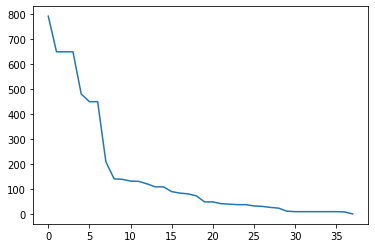

In [30]:
#plotting word counts
#Creating a figure and axis lets us do things like change the scaling or add a title
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(Panel_countedWords)), Panel_countedWords['count'])
plt.show()

This more or less displays Zipf's Law.
From Notebook 4:

    This effect is called Zipf's Law, and suggests that the most frequent word will occur approximately twice as often as the second most frequent word, three times as often as the third most frequent word, etc. Zipf's law is most easily observed by plotting the data on a log-log graph, with the axes being log (rank order) and log (frequency) resulting in a linear relationship.

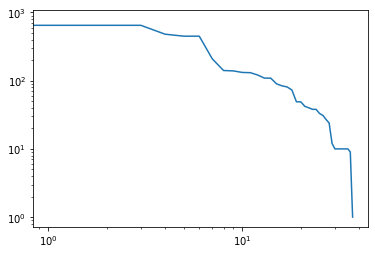

In [31]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(Panel_countedWords)), Panel_countedWords['count'])
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

From Notebook 4:
    
    The distribution was imagined by Zipf to be driven by a principle of 'least effort' where speakers did not work any harder than necessary to communicate a given idea, but the basis for this relationship is still not well understood and conforms at least as well to a process of preferential attachment whereby people disproportionately attend to popular words.

## Working with Raw Text

From Notebook 4:
        
        Previous iterations of the course used nltks tokenizer, but as we saw before, we used spaCy's model (https://spacy.io/api/tokenizer). We intend to avoid using NLTK when we can - for production level code, it is a lot faster and cleaner to use spaCy.

    That being said, nltk does have some useful methods for quick analysis of small corpora. We will explore a few here, and encourage you to figure out for yourself which other ones might be useful.

    To use the list of tokens in nltk, and take advantage of functions like concordance, shown above, we can convert it into a Text.

In [25]:
import nltk

In [33]:
PanelText = nltk.Text(Panel_tokens)

PanelIndex = nltk.text.ConcordanceIndex(PanelText) 
PanelIndex.print_concordance('information')

Displaying 25 of 109 matches:
receipt 1 2 items Extract summary information from 24 shopping receipts Busines
 shopping receipt Extract summary information from 24 shopping receipts of Item
 Classify Receipt Extract summary information from 8 shopping receipts of Items
eceipt 6 10 items Extract summary information from 6 shopping receipts Business
Phone Number Date Extract summary information from 24 shopping receipts Busines
receipts Business Extract summary information from 12 shopping receipts Busines
receipt 1 2 items Extract summary information from 12 shopping receipts Busines
 Classify Receipt Extract summary information from 12 shopping receipts Busines
receipt 1 2 items Extract summary information from 12 shopping receipts Payment
ipts are the same Extract summary information from 12 shopping receipts Busines
receipt 1 2 items Extract summary information from 12 shopping receipts Busines
ss Payment Method Extract summary information from 12 shopping receipts Payment
ment Metho

From Notebook 4:

    Note that the Text class is for doing rapid, exploratory analysis. It provides an easy interface to many of the operations we want to do, but it does not allow us much control over the particular operations it glosses. When you are doing a more complete analysis, you should be using the module specifically designed for that task instead of the shortcut method Text provides, e.g. use collocations Module instead of .collocations().

    Now that we have gotten this loaded, let's glance at few features we will delve into more deeply later.

    For example, we can find words that statistically tend to occur together and typically have a composite, idiomatic meaning irreducible to the semantics of its component words. We will do this later with more control over exactly how these are identified.

    Or we can pick a word (or words) and find what words tend to occur around it.

In [34]:
#finding words commonly occurring around another word
PanelText.common_contexts(['information'])

summary_from


In [35]:
#counting the number of time a word occurs
PanelText.count("summary")

109

C:\Users\acmel\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.
  self[key] = other[key]
C:\Users\acmel\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
C:\Users\acmel\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  self[key] = other[key]
C:\Users\acmel\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
C:\Users\acmel\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.level rcparam was deprecate

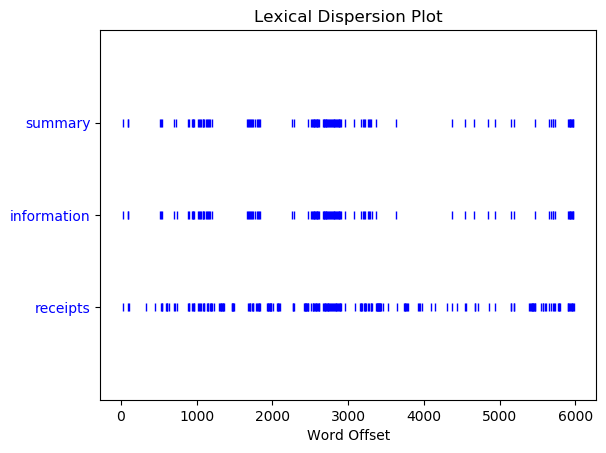

In [36]:
#plotting each time a set of words occurs 
sns.reset_orig() #Seaborn messes with this plot, disabling it
PanelText.dispersion_plot(["summary", "information", "receipts"])
sns.set() #Re-enabling seaborn

In [37]:
#finding the word count of each Title in the Panel subcorpus
Panel_df['tokenized_text'] = Panel_df['Title'].apply(lambda x: word_tokenize(x))
Panel_df['word_counts'] = Panel_df['tokenized_text'].apply(lambda x: len(x))
Panel_df['word_counts']

C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


2        10
3         7
4        10
5         8
6         7
7         7
8        10
29       10
700       2
701      10
706       7
1390      9
1391      2
1413     12
2054     10
2057     10
2069     10
2082     10
2083     10
2091      7
2107      7
2124     10
2131     10
2142      7
2718      7
2722     10
2727     10
2770      7
2782     10
2788     10
         ..
45832    11
45838    10
45840    10
45845    10
45846    10
45851     7
45862     7
45863     7
45865     7
45871     7
45874     7
45875    10
45882    10
45925    10
45926    10
45927    10
45963    10
46537    10
46555     7
46564     7
46578    10
47224     7
47879    10
47881    10
47893    10
47896    10
48560    10
48565    10
48569    10
48572    11
Name: word_counts, Length: 689, dtype: int64

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that filter, stem and lemmatize the tokens in your corpus, and then creates plots (with titles and labels) that map the word frequency distribution, word probability distribution, and at least two conditional probability distributions that help us better understand the social and cultural game underlying the production of your corpus. Create a wordl of words (or normalized words) and add a few vague comments about what mysteries are revealed through it.</span>

## Filtering and normalizing text

From Notebook 4: 
        
        As we want to start comparing the different releases we may choose to do a bit of filtering and normalizing that will allow us to focus on what we most care about. We can first make all of the words lower case, then drop the non-word tokens. Next, we can remove some 'stop words', stem the remaining words to remove suffixes, prefixes and (in some languages) infixes, or lemmatize tokens by intelligently grouping inflected or variant forms of the same word (e.g., with a stemmer and a dictionary).

    To begin this process, we will first define a function to work over the tokenized lists, then another to add normalized tokens to a new column.

    We will be using spaCy's built in stop words identifying capacity. When we run text through spaCy's language pipeline, it automatically tags it as a stop word.

    We can remove these stopwords from the analysis by fiat, but we could also take a more principled approach by looking at the frequency distribution of words and selecting a specific cut-off associated with the preservation of 'meaningful words' identified upon inspection. Alternatively, we could automatically set a cut-off by rule, such as removal of all words more frequent then the most frequent verb, or the most frequent noun (not pronoun), or some term of central interest.


In [38]:
countsDict = {}
for word in Panel_df['tokenized_text'].sum():
    if word in countsDict:
        countsDict[word] += 1
    else:
        countsDict[word] = 1
word_counts = sorted(countsDict.items(), key = lambda x : x[1], reverse = True)
word_counts

[('items', 763),
 ('Extract', 648),
 ('from', 648),
 ('shopping', 648),
 ('purchased', 449),
 ('a', 449),
 ('receipt', 449),
 ('receipts', 209),
 ('6', 141),
 ('5', 139),
 ('3', 132),
 ('2', 131),
 ('1', 121),
 ('summary', 109),
 ('information', 109),
 ('fields', 90),
 ('10', 84),
 ('12', 81),
 ('Business', 73),
 ('Payment', 49),
 ('Method', 49),
 ('8', 42),
 ('Total', 40),
 ('Phone', 38),
 ('Number', 38),
 ('Date', 33),
 ('Classify', 31),
 ('Receipt', 31),
 ('of', 27),
 ('Items', 27),
 ('4', 24),
 ('24', 12),
 ('Identify', 10),
 ('if', 10),
 ('two', 10),
 ('are', 10),
 ('the', 10),
 ('same', 10),
 ('7', 9),
 ('9', 1)]

In [15]:
#creating the function to normalize tokens + adding stop words
def normalizeTokens(word_list, extra_stop=["a","are","the","of"]):
    #We can use a generator here as we just need to iterate over it
    normalized = []
    if type(word_list) == list and len(word_list) == 1:
        word_list = word_list[0]

    if type(word_list) == list:
        word_list = ' '.join([str(elem) for elem in word_list]) 

    doc = nlp(word_list.lower())
    
    # add the property of stop word to words considered as stop words
    if len(extra_stop) > 0:
        for stopword in extra_stop:
            lexeme = nlp.vocab[stopword]
            lexeme.is_stop = True

    for w in doc:
        # if it's not a stop word or punctuation mark, add it to our article
        if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num and len(w.text.strip()) > 0:
            # we add the lematized version of the word
            normalized.append(str(w.lemma_))

    return normalized

In [40]:
Panel_df['normalized_tokens'] = Panel_df['tokenized_text'].apply(lambda x: normalizeTokens(x))

Panel_df['normalized_tokens_count'] = Panel_df['normalized_tokens'].apply(lambda x: len(x))

Panel_df

C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Requester,Title,HITs,Reward,filename,tokenized_text,word_counts,normalized_tokens,normalized_tokens_count
2,Panel,Extract purchased items from a shopping receip...,175,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",10,"[extract, purchase, item, shopping, receipt, i...",6
3,Panel,Extract purchased items from a shopping receipt,"3,327",0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",7,"[extract, purchase, item, shopping, receipt]",5
4,Panel,Extract purchased items from a shopping receip...,99,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",10,"[extract, purchase, item, shopping, receipt, i...",6
5,Panel,Extract summary information from 24 shopping r...,18,0.05,3-09_9-40.csv,"[Extract, summary, information, from, 24, shop...",8,"[extract, summary, information, shopping, rece...",6
6,Panel,Extract purchased items from a shopping receipt,25,0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",7,"[extract, purchase, item, shopping, receipt]",5
7,Panel,Extract purchased items from a shopping receipt,2,0.09,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",7,"[extract, purchase, item, shopping, receipt]",5
8,Panel,Extract purchased items from a shopping receip...,1,0.06,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",10,"[extract, purchase, item, shopping, receipt, i...",6
29,Panel,Extract purchased items from a shopping receip...,2,0.04,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,...",10,"[extract, purchase, item, shopping, receipt, i...",6
700,Panel,Classify Receipt,14,0.03,3-09_9-45.csv,"[Classify, Receipt]",2,"[classify, receipt]",2
701,Panel,Extract purchased items from a shopping receip...,108,0.01,3-09_9-45.csv,"[Extract, purchased, items, from, a, shopping,...",10,"[extract, purchase, item, shopping, receipt, i...",6


From Notebook 4:

    You can see that in the final step of normalizing, we add the lemmatized form of the word. spaCy's built in lemmatizer does this (https://spacy.io/api/lemmatizer). Lemmatization can be thought of as finding the root or the base of the word after removing inflections and other variations of words. Another possible way of finding the roots of words is using NLTK's porting or stemming functionalities, but we will not be getting into them.

From Notebook 4:

    Now that it is cleaned we start analyzing the dataset. We can start by finding frequency distributions for the dataset. Lets start looking at all the press releases together. The ConditionalFreqDist class reads in an iterable of tuples, the first element is the condition and the second the focal word. For starters, we will use word lengths as the conditions, but tags or clusters will provide more useful results.

In [41]:
#.sum() adds together the lists from each row into a single list
Panel_cfdist = nltk.ConditionalFreqDist(((len(w), w) for w in Panel_df['normalized_tokens'].sum()))

#print the number of words
print(Panel_cfdist.N())

3893


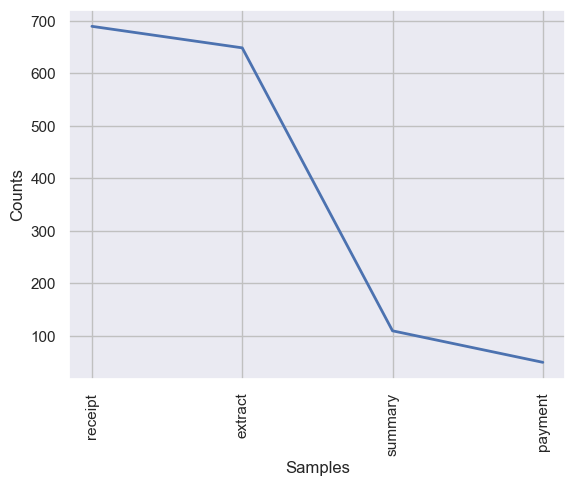

In [42]:
#from the number of words
#the different distributions of word lengths can be plotted

Panel_cfdist[7].plot()

    We can also create a Conditional Probability Distribution or ConditionalProbDist from the ConditionalFreqDist. To do this, however, we need a model for the probability distribution. A simple model is ELEProbDist which gives the expected likelihood estimate for the probability distribution of the experiment used to generate the observed frequency distribution.

In [43]:
Panel_cpdist = nltk.ConditionalProbDist(Panel_cfdist, nltk.ELEProbDist)

#print the most common 7 letter word
print(Panel_cpdist[7].max())

#And its probability
print(Panel_cpdist[7].prob(Panel_cpdist[7].max()))

receipt
0.4605878423513694


    Length is one feature of a word, but there are many more important features we care about. Another critical feature is a word's role in the sentence, or its part of speech (POS).

    The method below works similarly to nltk.pos_text, and can work with the conditional frequency distributions it provides.

In [44]:
def spacy_pos(word_list):
    tags = []
    doc = nlp(word_list.lower())
    for w in doc:
        tags.append((w.text, w.tag_))
    return tags

In [45]:
#creating a new column with the POS as an initial and the word in a tuple
#this is the format for compatibility with nltk.ConditionalFreqDist()
Panel_df['normalized_tokens_POS'] = [spacy_pos(t) for t in Panel_df['Title']]

C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [46]:
#frequency of each word as each POS
Panel_cfdist_WordtoPOS = nltk.ConditionalFreqDist(Panel_df['normalized_tokens_POS'].sum())
list(Panel_cfdist_WordtoPOS.items())[:10]

[('extract', FreqDist({'VB': 648})),
 ('purchased', FreqDist({'VBN': 449})),
 ('items', FreqDist({'NNS': 790})),
 ('from', FreqDist({'IN': 648})),
 ('a', FreqDist({'DT': 449})),
 ('shopping', FreqDist({'NN': 648})),
 ('receipt', FreqDist({'NN': 449, 'NNP': 31})),
 ('(', FreqDist({'-LRB-': 423})),
 ('1', FreqDist({'CD': 121})),
 ('-', FreqDist({'SYM': 314}))]

In [47]:
#frequency of each POS for each word
Panel_cfdist_WordtoPOS = nltk.ConditionalFreqDist((p, w) for w, p in Panel_df['normalized_tokens_POS'].sum())

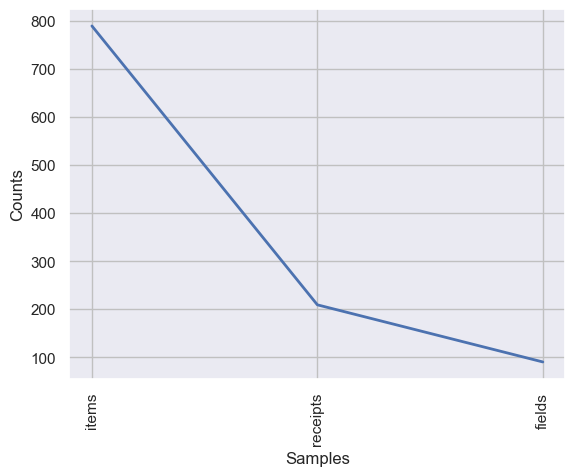

In [48]:
Panel_cfdist_WordtoPOS['NNS'].plot()

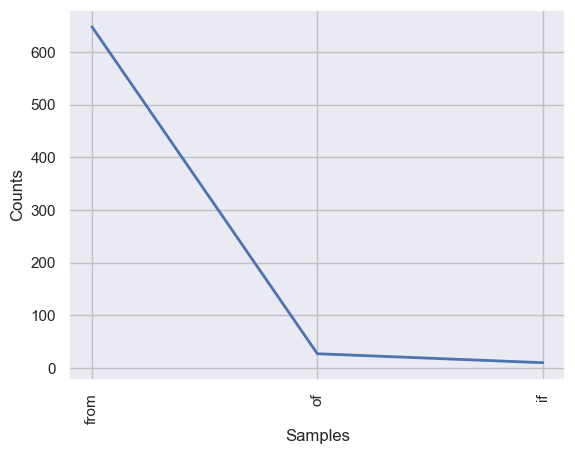

In [49]:
Panel_cfdist_WordtoPOS['IN'].plot()

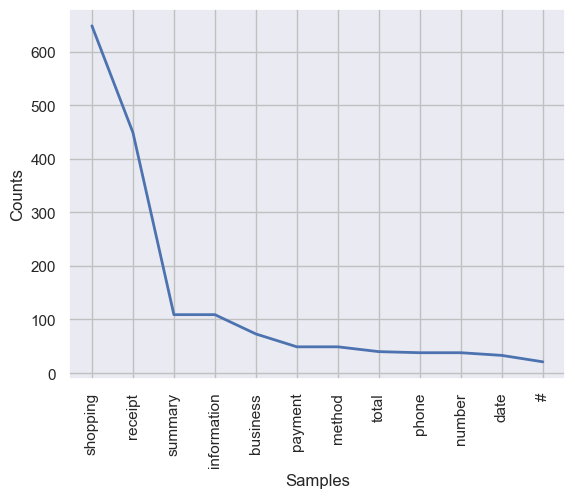

In [50]:
#nouns
Panel_cfdist_WordtoPOS['NN'].plot()

In [51]:
#adjectives
Panel_cfdist_WordtoPOS['JJ']

FreqDist({'same': 10})

In [52]:
#verbs
Panel_cfdist_WordtoPOS['VB'] #base
#Panel_cfdist_WordtoPOS['VBD'] #past tense
#Panel_cfdist_WordtoPOS['VBG'] #gerund or present participle
#Panel_cfdist_WordtoPOS['VBN'] #past participle
#Panel_cfdist_WordtoPOS['VBP'] #non-3rd person singular present
#Panel_cfdist_WordtoPOS['VBZ'] #3rd person singular present

FreqDist({'extract': 648, 'identify': 10})

In [53]:
#verbs
Panel_cfdist_WordtoPOS['VBP'] #non-3rd person singular present

FreqDist({'are': 10})

In [54]:
#verbs
Panel_cfdist_WordtoPOS['VBN'] #past participle

FreqDist({'purchased': 449})

In [55]:
#symbols
Panel_cfdist_WordtoPOS['SYM']

FreqDist({'-': 314})

In [56]:
#determiner
Panel_cfdist_WordtoPOS['DT']  #non-3rd person singular present

FreqDist({'a': 449, 'the': 10})

In [57]:
#similar analysis of word probabilities
Panel_cpdist_POStoWord = nltk.ConditionalProbDist(Panel_cfdist_WordtoPOS, nltk.ELEProbDist)

#print the most common nouns
print(Panel_cpdist_POStoWord['NN'].max())

#And its probability
print(Panel_cpdist_POStoWord['NN'].prob(Panel_cpdist_POStoWord['NN'].max()))

shopping
0.39019253910950663


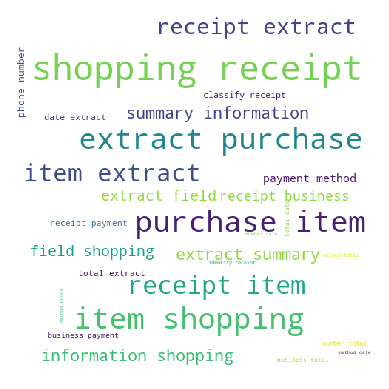

In [58]:
#creating a word cloud
Panel_wc = wordcloud.WordCloud(background_color="white", max_words=500, width= 1000, height = 1000, mode ='RGBA', scale=.5).generate(' '.join(Panel_df['normalized_tokens'].sum()))
plt.imshow(Panel_wc)
plt.axis("off")
plt.savefig("Panel_word_cloud.pdf", format = 'pdf')

this Wordl shows a few different significant semantic patterns:

1) receipt + business --> the receipts are from/for businesses  

2) extract + purchase --> the information being extracted is about purchases

3) purchase + items --> the purchases are of items

4) shopping + receipt --> the receipts are from shopping 

5) extract + summary --> the information being extracted is being summarized

etc 

## <span style="color:red">*Your turn*</span>

<span style="color:red">In the cells immediately following, perform POS tagging on a meaningful (but modest) subset of a corpus associated with your final project. Examine the list of words associated with at least three different parts of speech. Consider conditional associations (e.g., adjectives associated with nouns or adverbs with verbs of interest). What do these distributions suggest about your corpus?

## POS tagging

    In POS tagging, we classify each word by its semantic role in a sentence. We will be using the in-built spaCy pos-tagging.

    https://spacy.io/usage/linguistic-features

    spaCy pos-tags word as we run it through the english language model


    Grabbing the 10 highest scoring posts and tokenizing the sentences. Once again, notice that we aren't going to do any kind of stemming this week (although semantic normalization may be performed where we translate synonyms into the same focal word). Here, we will use sentences tokenized by spaCy. Like before, these methods can also be found in lucem_illud.

In [59]:
def sent_tokenize(word_list):
    doc = nlp(word_list)
    sentences = [sent.string.strip() for sent in doc.sents]
    return sentences

#Jasmine Wang
JasWang_df = df[df.Requester == "Jasmine Wang"]
JasWang_text = JasWang_df['Title'].to_list()
JasWang_list = JasWang_df['Title'].to_list()
JasWang_string = (list_to_string(JasWang_list))
JasWang_tokens = word_tokenize(JasWang_string)

In [60]:
#concattenating the csv files in the corpus
import glob


path = r'C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a'
all_files = glob.iglob(os.path.join(path, "*.csv")) 
df = pd.concat((pd.read_csv(f).assign(filename = f.replace(path+'\\', "")) for f in all_files), ignore_index=True).drop_duplicates(keep='last')
df.to_csv(r'C:\Users\acmel\OneDrive - The University of Chicago\SOCI 40133\SOCI_FINAL\Corpus1a.csv', index = False)
df

,Requester,Title,HITs,Reward,filename
0,Yixin Nie,Inference from the Text!,76,$0.12,3-09_9-40.csv
1,Sharmishtha Gupta,Watch TV clips and see if it's changing to/fro...,2,$0.05,3-09_9-40.csv
2,Panel,Extract purchased items from a shopping receip...,175,$0.01,3-09_9-40.csv
3,Panel,Extract purchased items from a shopping receipt,"3,327",$0.08,3-09_9-40.csv
4,Panel,Extract purchased items from a shopping receip...,99,$0.01,3-09_9-40.csv
5,Panel,Extract summary information from 24 shopping r...,18,$0.05,3-09_9-40.csv
6,Panel,Extract purchased items from a shopping receipt,25,$0.08,3-09_9-40.csv
7,Panel,Extract purchased items from a shopping receipt,2,$0.09,3-09_9-40.csv
8,Panel,Extract purchased items from a shopping receip...,1,$0.06,3-09_9-40.csv
9,TeamZ,Restaurant Receipt/Invoice with Bonus -- ITEMI...,"1,401",$0.08,3-09_9-40.csv


In [61]:
#removing the $ signs from the Reward column
df['Reward'] = df['Reward'].map(lambda x: x.lstrip(r'd\$'))

In [62]:
#converting decimals into floats to be sorted properly
df.Reward = df.Reward.astype(float)

In [63]:
#top 500 highest-paying HITs
df_topRewards = df.sort_values('Reward')[-500:]
df_topRewards['sentences'] = df_topRewards['Title'].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])
df_topRewards.index = range(len(df_topRewards) - 1, -1,-1) #Reindex to make things nice in the future
df_topRewards

,Requester,Title,HITs,Reward,filename,sentences
499,SurveyComet,Survey - webcam & audio recording required(~ 2...,23,10.0,3-18_5-00.csv,"[[Survey, webcam, audio, recording, required(~..."
498,SurveyComet,Survey - webcam & audio recording required(~ 2...,19,10.0,3-13_3-20.csv,"[[Survey, webcam, audio, recording, required(~..."
497,SurveyComet,Survey - webcam & audio recording required(~ 2...,19,10.0,3-17_1-15.csv,"[[Survey, webcam, audio, recording, required(~..."
496,Siqi Ning,Language-Cognition Interactions(~ 60 minutes),1,10.0,3-15_8-00.csv,"[[Language, Cognition, Interactions(~, 60, min..."
495,SurveyComet,Survey - webcam & audio recording required(~ 2...,21,10.0,3-17_1-15.csv,"[[Survey, webcam, audio, recording, required(~..."
494,SurveyComet,Survey - webcam & audio recording required(~ 2...,23,10.0,3-17_1-15.csv,"[[Survey, webcam, audio, recording, required(~..."
493,Acme Data Collection,NATIVE TAIWANESE SPEAKERS: Make 20 short recor...,1,10.0,3-15_8-00.csv,"[[NATIVE, TAIWANESE, SPEAKERS], [Make, 20, sho..."
492,SurveyComet,Survey - webcam & audio recording required(~ 2...,20,10.0,3-14_7-00.csv,"[[Survey, webcam, audio, recording, required(~..."
491,SurveyComet,Survey - webcam & audio recording required(~ 2...,19,10.0,3-14_7-00.csv,"[[Survey, webcam, audio, recording, required(~..."
490,Acme Data Collection,NATIVE TAIWANESE SPEAKERS: Make 20 short recor...,1,10.0,3-11_5-00.csv,"[[NATIVE, TAIWANESE, SPEAKERS], [Make, 20, sho..."


In [64]:
def tag_sents_pos(sentences):
    """
    function which replicates NLTK pos tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)
    
    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for token in sent:
            pos_sent.append((token.text, token.tag_))
        pos_sents.append(pos_sent)
    
    return pos_sents

In [65]:
df_topRewards['POS_sents'] = df_topRewards['sentences'].apply(lambda x: tag_sents_pos(x))
df_topRewards['POS_sents']

499    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
498    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
497    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
496    [[(Language, NN), (Cognition, NNP), (Interacti...
495    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
494    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
493    [[(NATIVE, NNP), (TAIWANESE, JJ), (SPEAKERS, N...
492    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
491    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
490    [[(NATIVE, NNP), (TAIWANESE, JJ), (SPEAKERS, N...
489    [[(Compensation, NN), (HIT, VBN), (for, IN), (...
488    [[(NATIVE, NNP), (TAIWANESE, JJ), (SPEAKERS, N...
487    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
486    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
485    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
484    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
483    [[(Survey, VB), (webcam, NNP), (audio, NN), (r...
482    [[(Compensation, NN), (H

In [66]:
#counting the number of NN (nouns)
countTarget = 'NN'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('audio', 123),
 ('DANISH', 69),
 ('Compensation', 33),
 ('Language', 25),
 ('screencast', 13),
 ('website', 13),
 ('Business', 13),
 ('owner', 13),
 ('laptop', 13),
 ('Study', 8),
 ('church', 8),
 ('sermon', 8),
 ('video', 8),
 ('clip', 8),
 ('access', 7),
 ('beta', 7),
 ('transport', 5),
 ('card', 5),
 ('top', 5),
 ('phone', 5),
 ('call', 5),
 ('handwriting', 3),
 ('HIT', 1),
 ('woker', 1),
 ('situation', 1)]

In [67]:
#counting the number of NNP (plural)
countTarget = 'NNS'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('recordings', 244),
 ('speakers', 214),
 ('minutes', 181),
 ('SPEAKERS', 30),
 ('Rules', 7),
 ('data', 3),
 ('others', 1)]

In [68]:
#counting the number of NNP (proper singular)
countTarget = 'NNP'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('webcam', 123),
 ('required(~', 123),
 ('NORWEGIAN', 70),
 ('품질', 34),
 ('평가', 34),
 ('소요시간', 34),
 ('매우쉬움', 34),
 ('페이', 34),
 ('매우높음', 34),
 ('NATIVE', 30),
 ('Cognition', 25),
 ('Interactions(~', 25),
 ('A1ZLHNJEURLK3O(~', 23),
 ('Social', 15),
 ('Upload', 13),
 ('Chrome', 13),
 ('Gambling', 8),
 ('Online', 8),
 ('Gaming(~', 8),
 ('Qualification', 7),
 ('Break', 7),
 ('Thumb', 7),
 ('Norms', 7),
 ('DUTCH', 6),
 ('iPad', 3),
 ('Apple', 3),
 ('Pencil', 3),
 ('Game', 2),
 ('Design', 2),
 ('A2HU1HGGYUO3X6(~', 2)]

In [69]:
#counting the number of NN (proper plural)
countTarget = 'NNPS'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('Effects', 2)]

In [70]:
#counting the number of JJ (adjective)
countTarget = 'JJ'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargetsNN = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargetsNN[:100]

[('short', 244),
 ('Native', 214),
 ('Swedish', 69),
 ('TAIWANESE', 30),
 ('Qual', 7),
 ('early', 7),
 ('Temporary', 1)]

In [71]:
#counting the number of verbs (gerund or present participle)
countTarget = 'VBG'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('recording', 123), ('using', 3)]

In [72]:
#counting the number of verbs (base form)
countTarget = 'VB'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('Survey', 123), ('Write', 6), ('say', 6), ('Collect', 3), ('be', 1)]

In [73]:
#counting the number of foreign words
countTarget = 'FW'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('직관적', 34)]

In [74]:
#counting the number of conjunctions (subordinating or preposition)
countTarget = 'IN'
targetCounts = {}
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:100]

[('for', 54),
 ('of', 20),
 ('About', 8),
 ('Transcribe', 8),
 ('during', 5),
 ('in', 1)]

In [75]:
#MODIFIERS
#counting the number of nouns that modify "speakers"
NTarget = 'NN'
Word = 'speakers'
NResults = set()
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for (ent1, kind1),(ent2,kind2) in zip(sentence[:-1], sentence[1:]):
            if (kind1,ent2.lower())==(NTarget,Word):
                NResults.add(ent1)
            else:
                continue

print(NResults)     

{'DANISH'}


In [76]:
#MODIFIERS
#counting the number of adjectives that modify "speakers"
NTarget = 'JJ'
Word = 'speakers'
NResults = set()
for entry in df_topRewards['POS_sents']:
    for sentence in entry:
        for (ent1, kind1),(ent2,kind2) in zip(sentence[:-1], sentence[1:]):
            if (kind1,ent2.lower())==(NTarget,Word):
                NResults.add(ent1)
            else:
                continue

print(NResults)     

{'TAIWANESE', 'Swedish'}


What these last two distibutions immediately suggest is that the highest paying HITs are most predominantly going to people who speak Danish, Swedish, and Taiwanese 

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that identify statistically significant bigrams, trigrams, quadgrams, higher-order *n*grams and skipgrams. Explore whether these collocations are idiomatic and so irreducible to the semantic sum of their component words. You can do this by examination of conditional frequencies (e.g., what else is 'united' besides the 'United States'). If these phrases are idiomatic, what do they suggest about the culture of the world producing them?

<span style="color:red">**Stretch**: In Manning and Schütze's textbook, there Section 5.3.2 explores how to use the *t*-test to find words whose co-occurance patterns best distinguish two words. Implement that and use it to explore phrases in your corpus. For instance, you could tell what words come after "America" much more often than after "Iraq"?</span> 

   ## Collocations
    As illustrated above, we might want to find significant bigrams (two-word phrases), trigrams (three-word phrases), n-grams (n-word phrases) or skip-grams (noncontinguous 'phrases' with skip-length n).

    We will begin with the nltk.collocations.BigramCollocationFinder class, which can be given raw lists of strings with the from_words() method. By default it only looks at continuous bigrams but there is an option (window_size) to allow skip-grams.

In [77]:
import nltk

In [78]:
#defining the score function (in this case, for raw counts)

#Panel_df Bigrams
PanelBigrams = nltk.collocations.BigramCollocationFinder.from_words(Panel_df['normalized_tokens'].sum())
print("There are {} bigrams in the finder".format(PanelBigrams.N))

There are 3893 bigrams in the finder


In [79]:
#NOTE: BigramCollocationFinder does not use strings internally
birgramScores = []

def bigramPrinting(count, wordsTuple, total):
    global birgramScores
    birgramScores.append("The first word is:  {}, The second word is: {}".format(*wordsTuple))
    #Returns None so all the tuples are considered to have the same rank

PanelBigrams.nbest(bigramPrinting, 10)
print('\n'.join(birgramScores[:10]))

The first word is:  648, The second word is: 449
The first word is:  449, The second word is: 790
The first word is:  790, The second word is: 648
The first word is:  648, The second word is: 689
The first word is:  689, The second word is: 790
The first word is:  790, The second word is: 648
The first word is:  689, The second word is: 648
The first word is:  648, The second word is: 109
The first word is:  109, The second word is: 109
The first word is:  109, The second word is: 648


    The words are each given numeric IDs and there is a dictionary that maps the IDs to the words they represent. This is a common performance optimization.

    Two words can appear together by chance. Recall from Manning and Schütze's textbook that a t-value can be computed for each bigram to see how significant the association is. You may also want to try computing the  𝜒2 , likelihood ratio, and pointwise mutual information statistics.

In [80]:
bigram_measures = nltk.collocations.BigramAssocMeasures()
PanelBigrams.score_ngrams(bigram_measures.likelihood_ratio)[:40]
# other options include student_t, chi_sq, likelihood_ratio, pmi

[(('shopping', 'receipt'), 3194.4986714010847),
 (('extract', 'purchase'), 1984.381088370791),
 (('purchase', 'item'), 1703.3399062818648),
 (('summary', 'information'), 994.3972906291074),
 (('item', 'shopping'), 946.8340279474621),
 (('payment', 'method'), 526.1419228268394),
 (('phone', 'number'), 427.4584033156184),
 (('extract', 'summary'), 407.26217192241313),
 (('information', 'shopping'), 407.26217192241313),
 (('extract', 'field'), 333.7737427376605),
 (('field', 'shopping'), 333.7737427376605),
 (('receipt', 'item'), 304.1942249128665),
 (('item', 'extract'), 262.5733115322691),
 (('receipt', 'business'), 259.4728438827401),
 (('receipt', 'extract'), 206.571017028489),
 (('classify', 'receipt'), 108.53369853944096),
 (('date', 'extract'), 107.48328857541938),
 (('number', 'total'), 93.09970996468866),
 (('business', 'payment'), 91.8615247470848),
 (('total', 'date'), 79.79021744513683),
 (('business', 'total'), 63.17009738328639),
 (('method', 'total'), 45.293642797536094),
 

shopping + receipt being by far the most likely bigram in this dataset confirms that the Panel HITs are concerned overwhelmingly with shopping receipts as their information object.  

the second most likely bigram, extract + purchase, confirms that the information contained within these objects is purchases which must be extracted by workers.

extract + purchase and extract + summary are the only bigrams starting with extract, implying that it is idiomatic to the extent that the extract command is directed towards the production of purchase info and summaries of other info, since summary+information is another very likely bigram.


In [81]:
#a few other measures 
[s for s in dir(bigram_measures) if s[0] != '_']

['chi_sq',
 'dice',
 'fisher',
 'jaccard',
 'likelihood_ratio',
 'mi_like',
 'phi_sq',
 'pmi',
 'poisson_stirling',
 'raw_freq',
 'student_t']

In [82]:
#Panel_df Trigrams
trigram_measures = nltk.collocations.TrigramAssocMeasures()
PanelTrigrams = nltk.collocations.TrigramCollocationFinder.from_words(Panel_df['normalized_tokens'].sum())
PanelTrigrams.score_ngrams(trigram_measures.student_t)[:20]

[(('extract', 'purchase', 'item'), 20.473878170118258),
 (('purchase', 'item', 'shopping'), 20.473878170118258),
 (('item', 'shopping', 'receipt'), 20.091298964613316),
 (('shopping', 'receipt', 'item'), 16.587543143245476),
 (('receipt', 'item', 'extract'), 15.789118831887928),
 (('item', 'extract', 'purchase'), 14.649576511807501),
 (('shopping', 'receipt', 'extract'), 13.39804493530501),
 (('receipt', 'extract', 'purchase'), 12.023915907880548),
 (('extract', 'summary', 'information'), 10.391649439803764),
 (('summary', 'information', 'shopping'), 10.391649439803764),
 (('information', 'shopping', 'receipt'), 10.132740264740132),
 (('extract', 'field', 'shopping'), 9.223986322788429),
 (('field', 'shopping', 'receipt'), 9.207355592902033),
 (('shopping', 'receipt', 'business'), 8.292301638690443),
 (('receipt', 'extract', 'field'), 7.335968688996335),
 (('classify', 'receipt', 'extract'), 5.403740790146597),
 (('receipt', 'payment', 'method'), 5.0776125090836075),
 (('date', 'extrac

In [83]:
#Panel_df N-grams (N = any number)

PanelNgrams = nltk.ngrams(Panel_df['normalized_tokens'].sum(), 5)
Counts = {}
for ngram in list(PanelNgrams):
    if ngram in Counts.keys():
        Counts[ngram] += 1
    else:
        Counts[ngram] = 1
Filtered = {}
for key in Counts.keys():
    if Counts[key] < 2:
        pass
    else:
        Filtered[key] = Counts[key]
print(Filtered)

{('extract', 'purchase', 'item', 'shopping', 'receipt'): 449, ('purchase', 'item', 'shopping', 'receipt', 'item'): 314, ('item', 'shopping', 'receipt', 'item', 'extract'): 294, ('shopping', 'receipt', 'item', 'extract', 'purchase'): 244, ('receipt', 'item', 'extract', 'purchase', 'item'): 244, ('item', 'extract', 'purchase', 'item', 'shopping'): 244, ('purchase', 'item', 'shopping', 'receipt', 'extract'): 130, ('item', 'shopping', 'receipt', 'extract', 'purchase'): 114, ('shopping', 'receipt', 'extract', 'purchase', 'item'): 142, ('receipt', 'extract', 'purchase', 'item', 'shopping'): 170, ('shopping', 'receipt', 'item', 'extract', 'summary'): 26, ('receipt', 'item', 'extract', 'summary', 'information'): 26, ('item', 'extract', 'summary', 'information', 'shopping'): 27, ('extract', 'summary', 'information', 'shopping', 'receipt'): 109, ('summary', 'information', 'shopping', 'receipt', 'business'): 73, ('information', 'shopping', 'receipt', 'business', 'extract'): 10, ('shopping', 'rece

5 seems like the biggest number that produces non-repeating n-grams 

In [84]:
#Gensim: another python text processing package that uses collocations and more
import gensim

C:\Users\acmel\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [85]:
#Panel bigrams
bigramPanel = gensim.models.Phrases(Panel_df['normalized_tokens'])
texts = [bigramPanel[line] for line in Panel_df['normalized_tokens']]
texts[0]

C:\Users\acmel\Anaconda3\lib\site-packages\gensim\models\phrases.py:494: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


['extract', 'purchase', 'item', 'shopping', 'receipt', 'item']

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform NER on a (modest) subset of your corpus of interest. List all of the different kinds of entities tagged? What does their distribution suggest about the focus of your corpus? For a subset of your corpus, tally at least one type of named entity and calculate the Precision, Recall and F-score for the NER classification just performed.

   ## Named-Entity Recognition
    Named Entity Recognition (NER) is also a classification task, which identifies named objects. Like every other part of the pipeline, spaCy also tags words with their tagged entity (https://spacy.io/api/entityrecognizer). You can see the full capacity of what spaCy does by checking out: https://spacy.io/usage/linguistic-features.

    For training the identification of such entities, spaCy uses a deep learning model.

In [86]:
def tag_sents_ner(sentences):
    """
    function which replicates NLTK ner tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)
    
    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for ent in sent.ents:
            pos_sent.append((ent.text, ent.label_))
        pos_sents.append(pos_sent)
    
    return pos_sents

In [87]:
#running NER on the Top Rewards subcorpus

df_topRewards['classified_sents'] = df_topRewards['sentences'].apply(lambda x: tag_sents_ner(x))
df_topRewards['classified_sents']

499                            [[(25 minutes, TIME)]]
498                            [[(25 minutes, TIME)]]
497                            [[(25 minutes, TIME)]]
496                            [[(60 minutes, TIME)]]
495                            [[(25 minutes, TIME)]]
494                            [[(25 minutes, TIME)]]
493         [[(TAIWANESE, NORP), (20, CARDINAL)], []]
492                            [[(25 minutes, TIME)]]
491                            [[(25 minutes, TIME)]]
490         [[(TAIWANESE, NORP), (20, CARDINAL)], []]
489                             [[(1 minutes, TIME)]]
488         [[(TAIWANESE, NORP), (20, CARDINAL)], []]
487                            [[(25 minutes, TIME)]]
486                            [[(25 minutes, TIME)]]
485                            [[(25 minutes, TIME)]]
484                            [[(25 minutes, TIME)]]
483                            [[(25 minutes, TIME)]]
482                             [[(1 minutes, TIME)]]
481                         

In [88]:
#finding the most common entities
entityCounts = {}
for entry in df_topRewards['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if ent in entityCounts:
                entityCounts[ent] += 1
            else:
                entityCounts[ent] = 1
sortedEntities = sorted(entityCounts.items(), key = lambda x: x[1], reverse = True)
sortedEntities[:10]

[('20', 244),
 ('25 minutes', 123),
 ('Native Swedish', 69),
 ('1 minutes', 31),
 ('TAIWANESE', 30),
 ('60 minutes', 25),
 ('Chrome', 13),
 ('Transcribe', 8),
 ('Qual', 7),
 ('Rules of Thumb for Social Norms', 7)]

this distribution implies that timing is significant for the highest paying HITs, as well as language, transcription, and Google Chrome

In [89]:
#finding entities which only occur 1x
[x[0] for x in sortedEntities if x[1] == 1]

[]

In [90]:
#finding the most common "non-objects"
nonObjCounts = {}
for entry in df_topRewards['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                continue
            elif ent in nonObjCounts:
                nonObjCounts[ent] += 1
            else:
                nonObjCounts[ent] = 1
sortedNonObj = sorted(nonObjCounts.items(), key = lambda x: x[1], reverse = True)
sortedNonObj[:10]

[('20', 244),
 ('25 minutes', 123),
 ('Native Swedish', 69),
 ('1 minutes', 31),
 ('TAIWANESE', 30),
 ('60 minutes', 25),
 ('Transcribe', 8),
 ('Qual', 7),
 ('A2HU1HGGYUO3X6(~ 1 minutes', 2)]

In [91]:
#finding Organizations
OrgCounts = {}
for entry in df_topRewards['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                print(ent)

Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Chrome
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
Rules of Thumb for Social Norms
iPad
Apple Pencil
iPad
Apple Pencil
iPad
Apple Pencil


This distribution confirms that Google Chrome is an important entity for the highest paying HITs

from sklearn.preprocessing import MultiLabelBinarizer
y = df_topRewards
MultiLabelBinarizer().fit_transform(y)

Precision:

In [92]:
sklearn.metrics.precision_score(df_topRewards['classified_sents'], df_topRewards['sentences'])

ValueError: You appear to be using a legacy multi-label data representation. Sequence of sequences are no longer supported; use a binary array or sparse matrix instead - the MultiLabelBinarizer transformer can convert to this format.

Recall:

In [93]:
sklearn.metrics.recall_score(df_topRewards['classified_sents'], df_topRewards['sentences'])

ValueError: You appear to be using a legacy multi-label data representation. Sequence of sequences are no longer supported; use a binary array or sparse matrix instead - the MultiLabelBinarizer transformer can convert to this format.

F1-measure:

In [94]:
sklearn.metrics.f1_score(df_topRewards['classified_sents'], df_topRewards['sentences'])

ValueError: You appear to be using a legacy multi-label data representation. Sequence of sequences are no longer supported; use a binary array or sparse matrix instead - the MultiLabelBinarizer transformer can convert to this format.

## <span style="color:red">*Your turn*</span>

<span style="color:red">In the cells immediately following, parse a (modest) subset of your corpus of interest. How deep are the phrase structure and dependency parse trees nested? How does parse depth relate to perceived sentence complexity? What are five things you can extract from these parses for subsequent analysis? (e.g., nouns collocated in a noun phrase; adjectives that modify a noun; etc.) Capture these sets of things for a focal set of words (e.g., "Bush", "Obama", "Trump"). What do they reveal about the roles that these entities are perceive to play in the social world inscribed by your texts?

## Dependency parsing and graph representations
    Dependency parsing was developed to robustly capture linguistic dependencies from text. The complex tags associated with these parses are detailed here. When parsing with the dependency parser, we will work directly from the untokenized text. Note that no processing takes place before parsing sentences--we do not remove so-called stop words or anything that plays a syntactic role in the sentence, although anaphora resolution and related normalization may be performed before or after parsing to enhance the value of information extraction.

    We will be using spaCy's built in dependancy parser to go about exploring the tree. Note that unlike previous examples, large corpuses or collections of sentences don't give us as much information, so we will be navigating smaller sentences.

    Let us start by exploring noun chunks. Noun chunks are “base noun phrases” – flat phrases that have a noun as their head. You can think of noun chunks as a noun plus the words describing the noun – for example, “the lavish green grass” or “the world’s largest tech fund”. To get the noun chunks in a document, simply iterate over the sentences noun chunks.

In [95]:
from spacy import displacy

In [96]:
#dataframe of all HITs from a single Requester

MLDLdf = df[df.Requester == "MLDataLabeler"]
MLDLdf.count()

MLDLtext = MLDLdf['Title'].to_list()
 
#print(MLRtext)

#column to list
MLDLlist = MLDLdf['Title'].to_list()
 
#print(MLRtext)

#list to string

def list_to_string(MLDLlist):
    
    MLDLstr = ' '
    return (MLDLstr.join(MLDLlist))
MLDLstring = (list_to_string(MLDLlist))
print(MLDLstring)

Qualifying HIT for Bounding Box Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Named Entity Recognition Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Semantic Segmentation Tasks - Up to $2.00 Bonus! Qualifying HIT for Bounding Box Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Named Entity Recognition Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Semantic Segmentation Tasks - Up to $2.00 Bonus! Qualifying HIT for Bounding Box Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Named Entity Recognition Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Semantic Segmentation Tasks - Up to $2.00 Bonus! Qualifying HIT for Bounding Box Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Named Entity Recognition Tasks - Bonus up to $2.00 Depending on Performance! Qualifying HIT for Semantic Segmentation Tasks - Up to $2.00 Bonus! Qualifyi

In [97]:
doc = nlp(MLDLstring)

In [98]:
displacy.render(doc, style='dep', jupyter=True)

In [99]:
for chunk in doc.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

Bounding Box Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Named Entity Recognition Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Semantic Segmentation Tasks - Up to $2.00 Bonus Bonus pobj for
Bounding Box Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Named Entity Recognition Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Semantic Segmentation Tasks - Up to $2.00 Bonus Bonus pobj for
Bounding Box Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Named Entity Recognition Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Semantic Segmentation Tasks - Up to $2.00 Bonus Bonus pobj for
Bounding Box Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Named Entity Recognition Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Semantic Segmentation Tasks - Up to $2.00 Bonus Bonus pobj for
Bounding Box Tasks - Bonus Bonus pobj for
Performance Performance pobj on
Named Entity Recognition Tasks - B

    spaCy uses the terms head and child to describe the words connected by a single arc in the dependency tree. The term dep is used for the arc label, which describes the type of syntactic relation that connects the child to the head. As with other attributes, the value of .dep is a hash value. You can get the string value with .dep_.

    For your reference:

    Text: The original token text.

    Dep: The syntactic relation connecting child to head.

    Head text: The original text of the token head.

    Head POS: The part-of-speech tag of the token head.

    Children: The immediate syntactic dependents of the token.

In [100]:
for token in doc:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

Qualifying ROOT Qualifying VERB [HIT, 2.00, Depending, !]
HIT dobj Qualifying VERB [for]
for prep HIT VERB [Bonus]
Bounding compound Bonus PROPN []
Box nmod Bonus PROPN []
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Bounding, Box, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, 2.00, Depending, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Named compound Bonus PROPN []
Entity compound Recognition PROPN []
Recognition compound Bonus PROPN [Entity]
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Named, Recognition, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depen

ikea compound HAMMARN NOUN []
- punct HAMMARN NOUN []
HAMMARN amod HIT VERB [ikea, -]
ikea compound GRANBODA ADJ []
- punct GRANBODA ADJ []
GRANBODA amod HIT VERB [ikea, -]
ikea npadvmod HEMLINGBY ADJ []
- punct HEMLINGBY ADJ []
HEMLINGBY amod HIT VERB [ikea, -]
ikea compound FJALLBO NOUN []
- punct FJALLBO NOUN []
FJALLBO compound HIT VERB [ikea, -]
ikea compound FLOTTEBO PROPN []
- punct FLOTTEBO PROPN []
FLOTTEBO compound HIT VERB [ikea, -]
Qualifying compound HIT VERB []
HIT nsubj 2.00 NUM [PS, TINGBY, KVISTBRO, KNOPPARP, SUNNERSTA, LERBERG, NORDMYRA, KARLSTAD, JANINGE, VITVAL, FLEKKE, HAMMARN, GRANBODA, HEMLINGBY, FJALLBO, FLOTTEBO, Qualifying, for]
for prep HIT VERB [Bonus]
Bounding compound Bonus PROPN []
Box nmod Bonus PROPN []
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Bounding, Box, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 ROOT 2.00 NUM [HIT, up, to, $, Depending, !]
Depending prep 2.00 NUM [on]
on pre

Bonus pobj for ADP [Named, Recognition, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, 2.00, Depending, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Bounding compound Bonus PROPN []
Box nmod Bonus PROPN []
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Bounding, Box, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Semantic compound Tasks PROPN []
Segmentation compound Tasks PROPN []
Tasks compound Up ADP 

up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, 2.00, Depending, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Bounding compound Bonus PROPN []
Box nmod Bonus PROPN []
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Bounding, Box, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Semantic compound Tasks PROPN []
Segmentation compound Tasks PROPN []
Tasks compound Up ADP [Semantic, Segmentation, -]
- punct Tasks PROPN []

$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Semantic compound Tasks PROPN []
Segmentation compound Tasks PROPN []
Tasks compound Up ADP [Semantic, Segmentation, -]
- punct Tasks PROPN []
Up quantmod 2.00 NUM [Tasks]
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 nummod Bonus PROPN [Up, to, $]
Bonus pobj for ADP [2.00]
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, 2.00, Depending, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Named compound Bonus PROPN []
Entity compound Recognition PROPN []
Recognition compound Bonus PROPN [Entity]
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Named, Recognition, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.

to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VERB [up, to, $]
Depending prep Qualifying VERB [on]
on prep Depending VERB [Performance]
Performance pobj on ADP []
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Semantic compound Tasks PROPN []
Segmentation compound Tasks PROPN []
Tasks compound Up ADP [Semantic, Segmentation, -]
- punct Tasks PROPN []
Up quantmod 2.00 NUM [Tasks]
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 nummod Bonus PROPN [Up, to, $]
Bonus pobj for ADP [2.00]
! punct Qualifying VERB []
Qualifying ROOT Qualifying VERB [HIT, for, 2.00, Depending, !]
HIT dobj Qualifying VERB []
for prep Qualifying VERB [Bonus]
Bounding compound Bonus PROPN []
Box nmod Bonus PROPN []
Tasks compound Bonus PROPN []
- punct Bonus PROPN []
Bonus pobj for ADP [Bounding, Box, Tasks, -]
up quantmod 2.00 NUM []
to quantmod 2.00 NUM []
$ quantmod 2.00 NUM []
2.00 dobj Qualifying VE

       Because the syntactic relations form a tree, every word has exactly one head. You can therefore iterate over the arcs in the tree by iterating over the words in the sentence. This is usually the best way to match an arc of interest — from below:

In [101]:
from spacy.symbols import nsubj, VERB

In [102]:
verbs = []
for possible_verb in doc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                verbs.append(possible_verb)
                break
                
print(verbs)

[see, see, press, see]


    You can also navigate from above. It isn't as efficient though.

In [103]:
verbs = []
for possible_verb in doc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                verbs.append(possible_verb)
                break

In [104]:
print(verbs)

[see, see, press, see]


## Iterating around the local tree
    A few more convenience attributes are provided for iterating around the local tree from the token. Token.lefts and Token.rights attributes provide sequences of syntactic children that occur before and after the token. Both sequences are in sentence order. There are also two integer-typed attributes, Token.n_lefts and Token.n_rights that give the number of left and right children.

In [105]:
#doc = nlp("bright red apples on the tree")
print([token.text for token in doc[2].lefts])  # ['bright', 'red']
print([token.text for token in doc[2].rights])  # ['on']
print(doc[2].n_lefts)  # 2
print(doc[2].n_rights)  # 1

[]
['Bonus']
0
1


    You can get a whole phrase by its syntactic head using the Token.subtree attribute. This returns an ordered sequence of tokens. You can walk up the tree with the Token.ancestors attribute, and check dominance with Token.is_ancestor

In [106]:
#doc = nlp("Credit and mortgage account holders must submit their requests")

root = [token for token in doc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

IndexError: list index out of range

    Finally, the .left_edge and .right_edge attributes can be especially useful, because they give you the first and last token of the subtree. This is the easiest way to create a Span object for a syntactic phrase. Note that .right_edge gives a token within the subtree — so if you use it as the end-point of a range, don’t forget to +1!

In [107]:
span = doc[doc[4].left_edge.i : doc[4].right_edge.i+1]
with doc.retokenize() as retokenizer:
    retokenizer.merge(span)
for token in doc:
    print(token.text, token.pos_, token.dep_, token.head.text)

Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep HIT
Bounding PROPN compound Bonus
Box PROPN nmod Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Named PROPN compound Bonus
Entity PROPN compound Recognition
Recognition PROPN compound Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Semantic PROPN compound Tasks
Segmentation PROPN compound Tasks
Tasks PROPN compound Up
- PUNCT punct

SLAKT NOUN compound HIT
ikea NOUN nmod PS-2012
- PUNCT punct PS-2012
Ikea PROPN compound PS-2012
- PUNCT punct PS-2012
PS-2012 PROPN compound HIT
ikea NOUN compound FLOTTEBO
- PUNCT punct FLOTTEBO
FLOTTEBO ADJ compound HIT
ikea NOUN nmod PS
- PUNCT punct PS
Ikea PROPN compound PS
- PUNCT punct PS
PS PROPN nmod ikea
ikea NOUN compound VIGGJA
- PUNCT punct VIGGJA
VIGGJA NOUN compound ikea
ikea NOUN compound TINGBY
- PUNCT punct TINGBY
TINGBY VERB compound HIT
ikea NOUN compound FLEKKE
- PUNCT punct FLEKKE
FLEKKE PROPN compound HIT
ikea NOUN compound SUNNERSTA
- PUNCT punct SUNNERSTA
SUNNERSTA NOUN compound HIT
ikea NOUN compound SLATTUM
- PUNCT punct SLATTUM
SLATTUM NOUN compound HIT
ikea NOUN compound RONNINGE
- PUNCT punct RONNINGE
RONNINGE NOUN compound HIT
ikea NOUN compound HIT
- PUNCT punct HIT
RASKOG PROPN compound HIT
ikea NOUN compound ORFJALL
- PUNCT punct ORFJALL
ORFJALL NOUN compound HIT
ikea NOUN compound HAMMARN
- PUNCT punct HAMMARN
HAMMARN NOUN amod HIT
ikea NOUN compound

Semantic PROPN compound Tasks
Segmentation PROPN compound Tasks
Tasks PROPN compound Up
- PUNCT punct Tasks
Up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM nummod Bonus
Bonus PROPN pobj for
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Named PROPN compound Bonus
Entity PROPN compound Recognition
Recognition PROPN compound Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Bounding PROPN compound Bonus
Box PROPN nmod Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP p

Segmentation PROPN compound Tasks
Tasks PROPN compound Up
- PUNCT punct Tasks
Up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM nummod Bonus
Bonus PROPN pobj for
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Named PROPN compound Bonus
Entity PROPN compound Recognition
Recognition PROPN compound Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Bounding PROPN compound Bonus
Box PROPN nmod Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN

Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Named PROPN compound Bonus
Entity PROPN compound Recognition
Recognition PROPN compound Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj for
up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM dobj Qualifying
Depending VERB prep Qualifying
on ADP prep Depending
Performance NOUN pobj on
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Semantic PROPN compound Tasks
Segmentation PROPN compound Tasks
Tasks PROPN compound Up
- PUNCT punct Tasks
Up ADP quantmod 2.00
to PART quantmod 2.00
$ SYM quantmod 2.00
2.00 NUM nummod Bonus
Bonus PROPN pobj for
! PUNCT punct Qualifying
Qualifying VERB ROOT Qualifying
HIT VERB dobj Qualifying
for ADP prep Qualifying
Bounding PROPN compound Bonus
Box PROPN nmod Bonus
Tasks PROPN compound Bonus
- PUNCT punct Bonus
Bonus PROPN pobj 

In [108]:
displacy.render(doc, style='dep', jupyter=True)

## Information Extraction
    How can dependancy graphs be useful? We can extract information from the sentences based on relationships between words within parsed phrases. Let us see if we can do this to glean any information, from, say, our movies dataset.

    How violent are the movies? Who is killing who?

In [109]:
df1 = df[0:100]
df1


,Requester,Title,HITs,Reward,filename
0,Yixin Nie,Inference from the Text!,76,0.12,3-09_9-40.csv
1,Sharmishtha Gupta,Watch TV clips and see if it's changing to/fro...,2,0.05,3-09_9-40.csv
2,Panel,Extract purchased items from a shopping receip...,175,0.01,3-09_9-40.csv
3,Panel,Extract purchased items from a shopping receipt,"3,327",0.08,3-09_9-40.csv
4,Panel,Extract purchased items from a shopping receip...,99,0.01,3-09_9-40.csv
5,Panel,Extract summary information from 24 shopping r...,18,0.05,3-09_9-40.csv
6,Panel,Extract purchased items from a shopping receipt,25,0.08,3-09_9-40.csv
7,Panel,Extract purchased items from a shopping receipt,2,0.09,3-09_9-40.csv
8,Panel,Extract purchased items from a shopping receip...,1,0.06,3-09_9-40.csv
9,TeamZ,Restaurant Receipt/Invoice with Bonus -- ITEMI...,"1,401",0.08,3-09_9-40.csv


In [110]:
df1['tokenized_text'] = df1['Title'].apply(lambda x: word_tokenize(x))
df1

C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Requester,Title,HITs,Reward,filename,tokenized_text
0,Yixin Nie,Inference from the Text!,76,0.12,3-09_9-40.csv,"[Inference, from, the, Text]"
1,Sharmishtha Gupta,Watch TV clips and see if it's changing to/fro...,2,0.05,3-09_9-40.csv,"[Watch, TV, clips, and, see, if, it, 's, chang..."
2,Panel,Extract purchased items from a shopping receip...,175,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
3,Panel,Extract purchased items from a shopping receipt,"3,327",0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
4,Panel,Extract purchased items from a shopping receip...,99,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
5,Panel,Extract summary information from 24 shopping r...,18,0.05,3-09_9-40.csv,"[Extract, summary, information, from, 24, shop..."
6,Panel,Extract purchased items from a shopping receipt,25,0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
7,Panel,Extract purchased items from a shopping receipt,2,0.09,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
8,Panel,Extract purchased items from a shopping receip...,1,0.06,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
9,TeamZ,Restaurant Receipt/Invoice with Bonus -- ITEMI...,"1,401",0.08,3-09_9-40.csv,"[Restaurant, Receipt, Invoice, with, Bonus, IT..."


In [111]:
#how long are Requesters giving workers to complete HITS?  
#What correlation does that have with pay? 
df1_extractions = {}

for chunk in doc.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

In [132]:
for index, row in df1.iterrows():
    text = ' '.join(row['tokenized_text'])
    df1_extractions[row['Requester']] = ([], [])
    doc = nlp(text)
    for chunk in doc.noun_chunks:
            subject = 0
            object_ = 0
            # if the verb or the root of the sentence is 
            if chunk.root.head.text == 'Extract':
                # we find the subjects and objects around the word, and if it does exist, add it to the tuple
                if chunk.root.dep_ == 'nsubj':
                    subject = chunk.root.text
                if chunk.root.dep_ == 'dobj':
                    object_ = chunk.root.text
                if subject is not 0:
                    df1_extractions[row['Requester']][0].append(subject)
                if object_ is not 0:
                    df1_extractions[row['Requester']][1].append(object_)

In [115]:
df1_extractions

{'Yixin Nie': ([], []),
 'Sharmishtha Gupta': ([], []),
 'Panel': ([], []),
 'TeamZ': ([], []),
 'Ibotta, Inc.': ([], []),
 'Rece Capture': ([], []),
 'Shopping Receipts': ([], ['Data']),
 'Job Spotter': ([], []),
 'Crowdsurf Support': ([], []),
 'Patrick': ([], []),
 'James Billings': ([], []),
 'Foxtrot': ([], []),
 'p9r': ([], []),
 'Panos Ipeirotis': ([], []),
 'rich hoffman': ([], []),
 'lovergingers': ([], []),
 'Dorothy': ([], []),
 'Peggy Keller': ([], []),
 'zhou yu': ([], []),
 'CopyText Inc.': ([], []),
 'Tracy Worrell': ([], []),
 'Ignite Media Solutions': ([], []),
 'Bill Xouris': ([], []),
 'FullContact': ([], []),
 'Social Perception Research Lab': ([], []),
 'PickFu': ([], []),
 'SocialCat': ([], []),
 'HUGC': ([], []),
 'Melissa': ([], []),
 'The Site Mechanics': ([], []),
 'Shinichi Yamasaki': ([], []),
 'SnapStays': ([], []),
 'Publishing': ([], []),
 'Justin Thacker': ([], []),
 'Sewon Min': ([], []),
 'Joe Hsu': ([], []),
 'CEL': ([], []),
 'str11223344': ([], []),

## <span style="color:red">*Exercise 6*</span>

<span style="color:red">Construct cells immediately below this that calculate the KL and $\chi^2$ divergences, and the KS and Wasserstein distances between four separate corpora, plot these with heatmaps, and then array them in two dimensions with multidimensional scaling as above. What does this reveal about relations between the corpora? Which analysis (and divergence or distribution) distinguishes the authors or documents better? 

<span style="color:red">**Stretch**: Calculate the <a "href=https://en.wikipedia.org/wiki/Jensen–Shannon_divergence" target="_blank">Jensen-Shannon Divergence</a> between your four corpora. What is the relationship between the KL and JS divergences?</span> 

# Distributional distances

If we want to compare different corpora, we need a distance or divergence that compares the two distributions.

We will use the: 

+ Kullback-Leibler (KL) divergence
+ $\chi^2$ divergence
+ Kolmogorov-Smirnov (KS) distance
+ Wasserstein distance

### Kullback-Leibler and $x^2$ divergences ###

KL and $\chi^2$ divergences are members of the broader <a "href=https://en.wikipedia.org/wiki/F-divergence" target="_blank">$f$-divergence</a> family, a function of $D_f (P || Q)$ that calculates the difference between two probability distributions P and Q. The KL $f(t)$ is $ t \text{ log } t $, while the $\chi^2$ is $t^2-1$. KL comes from information and $\chi^2$ from measure theory. As such, the KL divergence computes the relative entropy between two distributions--how they differ in bits, while the $\chi^2$ whether the same statistical inferences can be drawn from them both.  

Specifically, given two discrete probability distributions $P$ and $Q$, the Kullback-Leibler divergence from $Q$ to $P$ is defined as:

$D_{\mathrm{KL}}(P\|Q) = \sum_i P(i) \, \log\frac{P(i)}{Q(i)}$.

The [scipy.stats.entropy()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.entropy.html) function does the calculation for you, which takes in two arrays of probabilities and computes the KL divergence. Note that the KL divergence is in general not commutative, i.e. $D_{\mathrm{KL}}(P\|Q) \neq D_{\mathrm{KL}}(Q\|P)$ .

Also note that the KL divernce is the sum of elementwise divergences. Scipy provides [scipy.special.kl_div()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.kl_div.html#scipy-special-kl-div) which calculates elementwise divergences for you.

The $\chi^2$ Divergence is defined as:

$D_{\mathrm{\chi^2}}(P\|Q) = \sum_i \left(\frac{P(i)}{Q(i)}-1\right)^2$. 

This is also noncommutative, and the code can be drawn directly from scipy.

### Kolmogorov-Smirnov ###

The two-sample Kolmogovorov-Smirnov test statistic calculates the distance between the cumulative distribution function of the two distributions to be compared, and, along with the $x^2$ divergence, is among the most common approaches two calculating a distance in statistics. It can be interpreted as a test of whether two distributions are drawn from the same underlying distribution. As with the others, the code is readily available in scipy.

### Wasserstein Distance ###

When this is computed on a Euclidian metric structure (e.g., numbers of words), this is also known as the earth mover’s distance, because it can be seen as the minimum amount of "work" required to transform $P$ into $Q$, where "work" is measured as the amount of distribution weight that must be moved, multiplied by the distance it has to be moved.

### Computing ###

To do this we will need to create the arrays, lets compare the Whitehouse releases with the Kennedy releases. First we have to download them and load them into a DataFrame.

In [116]:
#FOUR DIFFERENT CORPORA: 4 DIFFERENT REQUESTERS

In [117]:
#Panel_df
Panel_df['tokenized_text'] = Panel_df['Title'].apply(lambda x: word_tokenize(x))
Panel_df['normalized_tokens'] = Panel_df['tokenized_text'].apply(lambda x: normalizeTokens(x))


C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [118]:
#Plancky_df
Plancky_df = df[df.Requester == "Plancky"]

Plancky_df['tokenized_text'] = Plancky_df['Title'].apply(lambda x: word_tokenize(x))
Plancky_df['normalized_tokens'] = Plancky_df['tokenized_text'].apply(lambda x: normalizeTokens(x))


C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [119]:
#MLRdf

MLRdf['tokenized_text'] = MLRdf['Title'].apply(lambda x: word_tokenize(x))
MLRdf['normalized_tokens'] = MLRdf['tokenized_text'].apply(lambda x: normalizeTokens(x))


C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [120]:
#MLDLdf
MLDLdf['tokenized_text'] = MLDLdf['Title'].apply(lambda x: word_tokenize(x))
MLDLdf['normalized_tokens'] = MLDLdf['tokenized_text'].apply(lambda x: normalizeTokens(x))


C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [121]:
#comparing the words in the 4 corpora, 
#[removing those not found in both = false], 
#and assigning the remaining words indices

PanelWords = set(Panel_df['normalized_tokens'].sum())
PlanckyWords = set(Plancky_df['normalized_tokens'].sum())
MLRWords = set(MLRdf['normalized_tokens'].sum())
MLDLWords = set(MLDLdf['normalized_tokens'].sum())

#Change & to | if you want to keep all words
overlapWords = PanelWords | PlanckyWords | MLRWords | MLDLWords

overlapWordsDict = {word: index for index, word in enumerate(overlapWords)}
overlapWordsDict['extract']

133

    Now we can count the occurrences of each word in the corpora and create our arrays. Note that we don't have to use numpy arrays as we do here. We could just use a list, but the arrays are faster in numpy so we encourage you to get in the habit of using them.

In [122]:
def makeProbsArray(dfColumn, overlapDict):
    words = dfColumn.sum()
    countList = [0] * len(overlapDict)
    for word in words:
        try:
            countList[overlapDict[word]] += 1
        except KeyError:
            #The word is not common so we skip it
            pass
    countArray = np.array(countList)
    return countArray / countArray.sum()

PanelProbArray = makeProbsArray(Panel_df['normalized_tokens'], overlapWordsDict)
PlanckyProbArray  = makeProbsArray(Plancky_df['normalized_tokens'], overlapWordsDict)
MLRProbArray  = makeProbsArray(MLRdf['normalized_tokens'], overlapWordsDict)
MLDLProbArray  = makeProbsArray(MLDLdf['normalized_tokens'], overlapWordsDict)
PanelProbArray.sum()
#There is a little bit of a floating point math error
#but it's too small to see with print and too small matter here

1.0

    We can now compute the KL divergence. Pay attention to the asymmetry. Use the Jensen–Shannon divergence, which is the average KL divergence between each distribution and the average of both distributions (i.e., the midpoint), if you want symmetry.

In [123]:
MLR_MLDL_Divergence = scipy.stats.entropy(MLRProbArray, MLDLProbArray)
print (MLR_MLDL_Divergence)
MLDL_MRL_Divergence = scipy.stats.entropy(MLDLProbArray, MLRProbArray)
print (MLDL_MRL_Divergence)

inf
inf


    Then, we can do the elementwise calculation and see which words best distinguish the two corpora.


In [125]:
MLR_MLDL_Divergence_ew = scipy.special.kl_div(MLRProbArray, MLDLProbArray)
kl_df = pd.DataFrame(list(overlapWordsDict.keys()), columns = ['word'], index = list(overlapWordsDict.values()))
kl_df = kl_df.sort_index()
kl_df['elementwise divergence'] = MLR_MLDL_Divergence_ew
kl_df[:10]

,word,elementwise divergence
0,time,0.000000
1,live,0.000000
2,unionize,0.000000
3,question,inf
4,qualify,0.098485
5,micke,0.001894
6,docksta,0.000473
7,own,0.000000
8,insure,0.000000
9,tingby,0.002841


In [126]:
kl_df.sort_values(by='elementwise divergence', ascending=False)[:10]

,word,elementwise divergence
124,level,inf
148,table,inf
20,different,inf
41,difficulty,inf
165,numeric,inf
23,little,inf
103,update,inf
101,minute,inf
53,bit,inf
13,simplify,inf


    Now we will apply what we learned today First, let's transform every text into normalized tokens. Note that in this first step, no stopword is removed. We'll use only the first 11 movies: you are welcome to try more.

In [135]:
df1


,Requester,Title,HITs,Reward,filename,tokenized_text
0,Yixin Nie,Inference from the Text!,76,0.12,3-09_9-40.csv,"[Inference, from, the, Text]"
1,Sharmishtha Gupta,Watch TV clips and see if it's changing to/fro...,2,0.05,3-09_9-40.csv,"[Watch, TV, clips, and, see, if, it, 's, chang..."
2,Panel,Extract purchased items from a shopping receip...,175,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
3,Panel,Extract purchased items from a shopping receipt,"3,327",0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
4,Panel,Extract purchased items from a shopping receip...,99,0.01,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
5,Panel,Extract summary information from 24 shopping r...,18,0.05,3-09_9-40.csv,"[Extract, summary, information, from, 24, shop..."
6,Panel,Extract purchased items from a shopping receipt,25,0.08,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
7,Panel,Extract purchased items from a shopping receipt,2,0.09,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
8,Panel,Extract purchased items from a shopping receip...,1,0.06,3-09_9-40.csv,"[Extract, purchased, items, from, a, shopping,..."
9,TeamZ,Restaurant Receipt/Invoice with Bonus -- ITEMI...,"1,401",0.08,3-09_9-40.csv,"[Restaurant, Receipt, Invoice, with, Bonus, IT..."


In [11]:
df2 = df[100:200]
df2


,Requester,Title,HITs,Reward,filename
100,Shopping Receipts,Extract Data From Shopping Receipt,454,0.02,3-09_9-40.csv
101,Shopping Receipts,Extract Data From Shopping Receipt,8,0.02,3-09_9-40.csv
102,quarrel-recast,Sentence Rewrite,5,0.12,3-09_9-40.csv
103,Julia Przedworski,Help measure joy at work(~ 9 minutes),3,1.50,3-09_9-40.csv
104,Abhi Yerra,"Find Person Information from Company Name, Com...",7,0.01,3-09_9-40.csv
105,Harsha Gangadharbatla,Answer a survey about your opinions on some ad...,1,0.40,3-09_9-40.csv
106,School Info,Match Row in Spreadsheet v555184_1583794830.csv,4,0.04,3-09_9-40.csv
107,School Info,Match Row in Spreadsheet v334318_1583794825.csv,1,0.04,3-09_9-40.csv
108,School Info,Match Row in Spreadsheet v522589_1583794821.csv,2,0.04,3-09_9-40.csv
109,Darian Rafie,Transcribe name and address from image,1,0.70,3-09_9-40.csv


In [16]:
#tokenizing and normalizing text
df2['tokenized_text'] = df2['Title'].apply(lambda x: word_tokenize(x))
df2['normalized_tokens'] = df2['tokenized_text'].apply(lambda x: normalizeTokens(x))
df2

C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\acmel\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Requester,Title,HITs,Reward,filename,tokenized_text,normalized_tokens
100,Shopping Receipts,Extract Data From Shopping Receipt,454,0.02,3-09_9-40.csv,"[Extract, Data, From, Shopping, Receipt]","[extract, datum, shop, receipt]"
101,Shopping Receipts,Extract Data From Shopping Receipt,8,0.02,3-09_9-40.csv,"[Extract, Data, From, Shopping, Receipt]","[extract, datum, shop, receipt]"
102,quarrel-recast,Sentence Rewrite,5,0.12,3-09_9-40.csv,"[Sentence, Rewrite]","[sentence, rewrite]"
103,Julia Przedworski,Help measure joy at work(~ 9 minutes),3,1.50,3-09_9-40.csv,"[Help, measure, joy, at, work(~, 9, minutes]","[help, measure, joy, work(~, minute]"
104,Abhi Yerra,"Find Person Information from Company Name, Com...",7,0.01,3-09_9-40.csv,"[Find, Person, Information, from, Company, Nam...","[find, person, information, company, company, ..."
105,Harsha Gangadharbatla,Answer a survey about your opinions on some ad...,1,0.40,3-09_9-40.csv,"[Answer, a, survey, about, your, opinions, on,...","[answer, survey, opinion, advertisement]"
106,School Info,Match Row in Spreadsheet v555184_1583794830.csv,4,0.04,3-09_9-40.csv,"[Match, Row, in, Spreadsheet, v555184_15837948...","[match, row, spreadsheet, v555184_1583794830.csv]"
107,School Info,Match Row in Spreadsheet v334318_1583794825.csv,1,0.04,3-09_9-40.csv,"[Match, Row, in, Spreadsheet, v334318_15837948...","[match, row, spreadsheet, v334318_1583794825.csv]"
108,School Info,Match Row in Spreadsheet v522589_1583794821.csv,2,0.04,3-09_9-40.csv,"[Match, Row, in, Spreadsheet, v522589_15837948...","[match, row, spreadsheet, v522589_1583794821.csv]"
109,Darian Rafie,Transcribe name and address from image,1,0.70,3-09_9-40.csv,"[Transcribe, name, and, address, from, image]","[transcribe, address, image]"


In [17]:

corpora = []
for index, row in df2.iterrows():
    if len(corpora) > 10:
        break
    corpora.append(row['tokenized_text'])

In [18]:
corpora

[['Extract', 'Data', 'From', 'Shopping', 'Receipt'],
 ['Extract', 'Data', 'From', 'Shopping', 'Receipt'],
 ['Sentence', 'Rewrite'],
 ['Help', 'measure', 'joy', 'at', 'work(~', '9', 'minutes'],
 ['Find',
  'Person',
  'Information',
  'from',
  'Company',
  'Name',
  'Company',
  'URL',
  'and',
  'LinkedIN'],
 ['Answer',
  'a',
  'survey',
  'about',
  'your',
  'opinions',
  'on',
  'some',
  'advertisements'],
 ['Match', 'Row', 'in', 'Spreadsheet', 'v555184_1583794830.csv'],
 ['Match', 'Row', 'in', 'Spreadsheet', 'v334318_1583794825.csv'],
 ['Match', 'Row', 'in', 'Spreadsheet', 'v522589_1583794821.csv'],
 ['Transcribe', 'name', 'and', 'address', 'from', 'image'],
 ['Find',
  'Details',
  'for',
  'Flesh',
  'and',
  'Blood',
  'Trading',
  'Card',
  'Game']]

In [19]:
#separating the normalized tokens into stopwords and non-stopwords
corpora_s = []
corpora_nons = []
for corpus in corpora:
    s = []
    nons = []
    doc = nlp(' '.join(corpus))
    for word in doc:
        if word.is_stop:
            s.append(word.text)
        else:
            nons.append(word.text)
    corpora_s.append(s)
    corpora_nons.append(nons)

In [20]:
#defining functions for calculating divergence and distances
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pd.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pd.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

    Now we will calculate the KL divergence for each pair of corpora, turn the results into a matrix, and visualize the matrix as a heatmap. Recall that  𝐷KL(𝑃‖𝑄)  measures the amount of information loss when  𝑄  is used to approximate  𝑃 . Here, the rows are the  𝑃 s used for calculating KL divergences, and the columns are the  𝑄 s. So, each cell measures the amount of information loss when the word distribution of the column text is used to approximate the word distribution of the row text. Because the KL divergence is directional, such that the divergence of  𝑃  from  𝑄  is different from the same of  𝑄  from  𝑃 , the matrix is assymetric and contains unique information above and below the diagonal. The same is true for the  𝜒2  divergence.

In [21]:
len(corpora)

11

In [22]:
fileids = list(df2['Requester'])[0:11]

C:\Users\acmel\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2544: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=0)


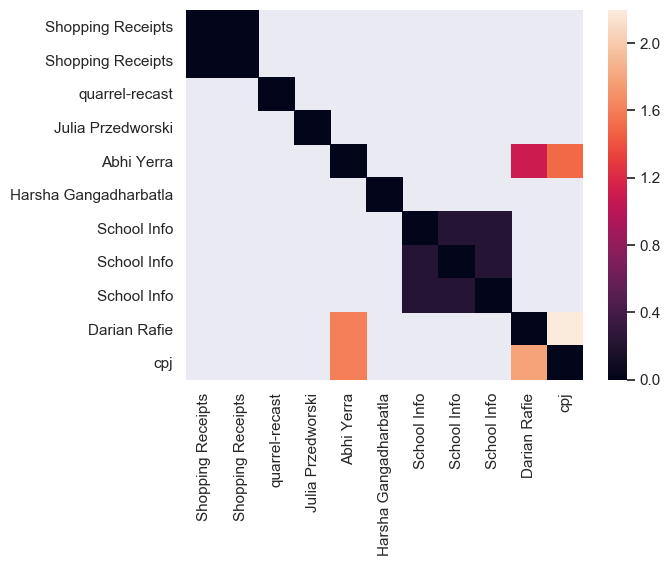

In [217]:
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference = 'KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

In [232]:
#checking for NaN values in the dataframe

df2.isnull().any()

Requester            False
Title                False
HITs                 False
Reward               False
filename             False
tokenized_text       False
normalized_tokens    False
dtype: bool

In [233]:
#in the M array
np.isnan(M).any()

False

In [234]:
M

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 1.09861229,
        1.5040774 ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.

In [227]:
#resolving nans in M array

#M = M[~np.isnan(M)]
#np.where(np.isfinite(M), M, 0)
M[np.isnan(M)] = np.median(M[~np.isnan(M)])

M

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 1.09861229,
        1.5040774 ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.

C:\Users\acmel\Anaconda3\lib\site-packages\sklearn\manifold\mds.py:421: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn("The MDS API has changed. ``fit`` now constructs an"


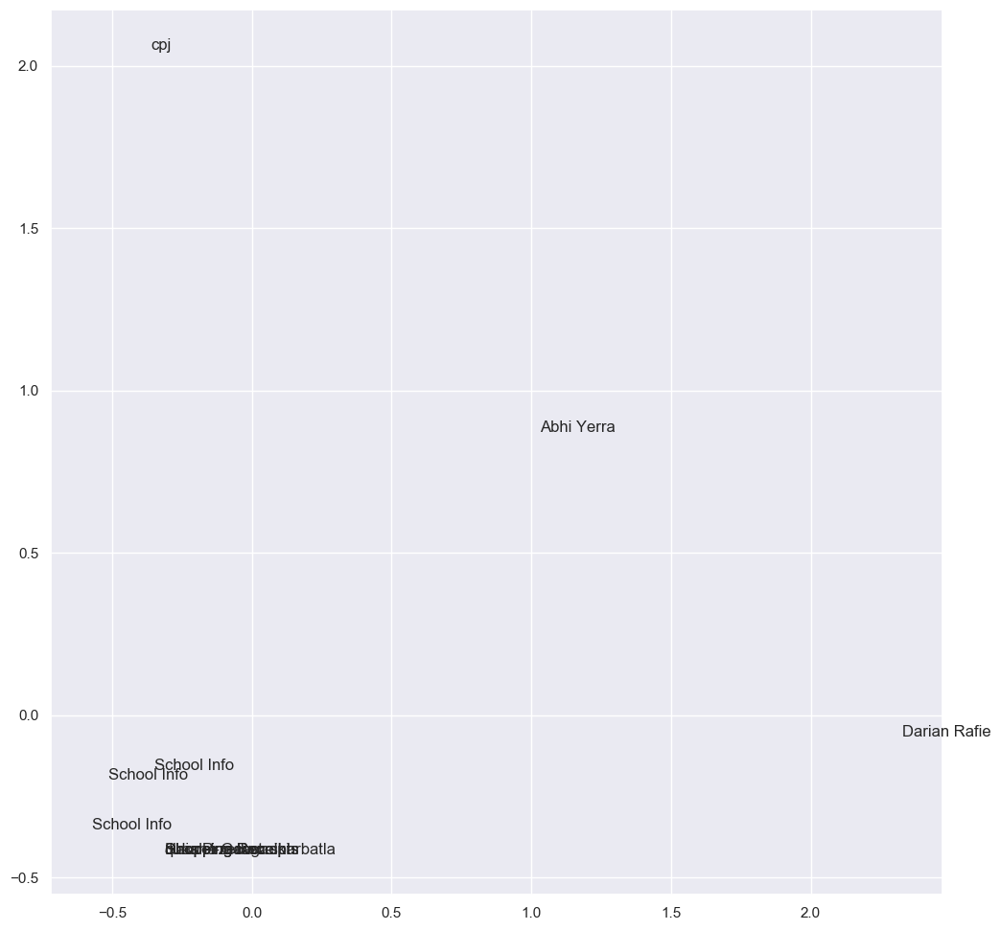

In [229]:
#multidimensional scaling of the matrix


mds = sklearn.manifold.MDS()
pos = mds.fit(M).embedding_
x = pos[:,0]
y = pos[:,1]
fig, ax = plt.subplots(figsize = (12,12))
plt.plot(x, y, ' ')
for i, txt in enumerate(fileids):
    ax.annotate(txt, (x[i],y[i]))

In [23]:
fileids = list(df2['Requester'])[0:11]

In [28]:
#re-analysis for stopwords

L = []
for p in corpora_s:
    l = []
    for q in corpora_s:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

TypeError: ufunc 'rel_entr' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

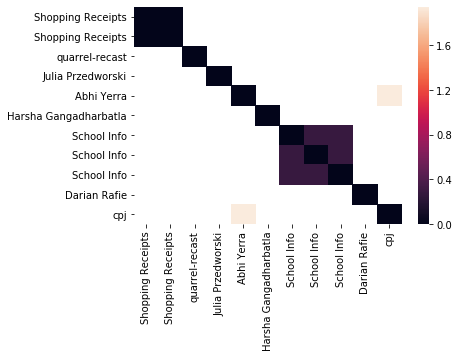

In [29]:
#re-analysis for non-stopwords
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

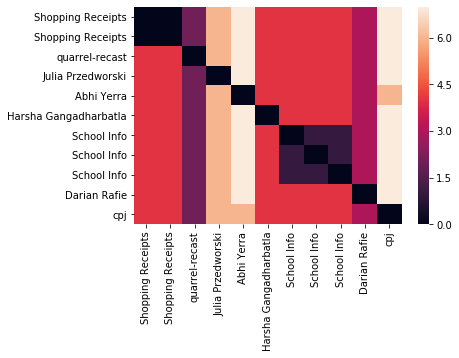

In [31]:
#computing the same for the assymmetric  𝜒2  Divergence.
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='Chi2'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

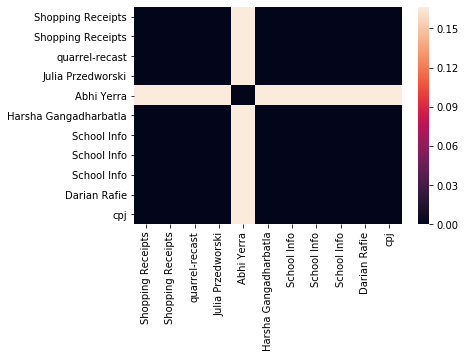

In [33]:
#computing the same for the KS distance
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

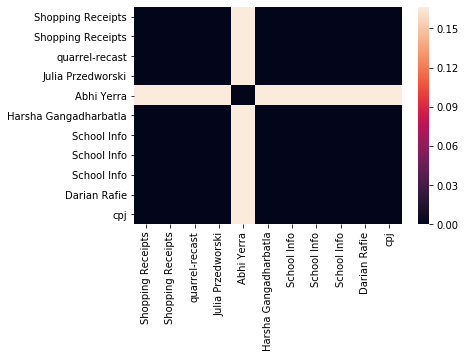

In [35]:
#computing the same for the Wasserstein ("earth mover's") distance
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='Wasserstein'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

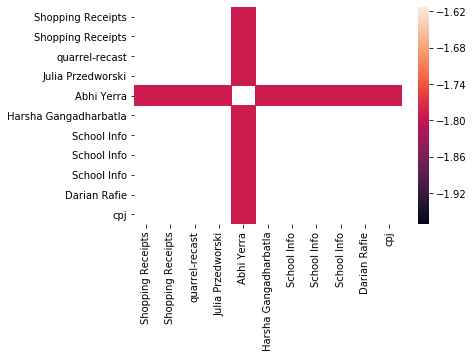

In [36]:
#taking the log of each cell
#which will reduce the distance of decode X from other texts as an outlier

ax = sns.heatmap(div.apply(np.log).replace([np.inf, -np.inf], np.nan))
plt.show()